In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = "1"

import rasterio
from matplotlib import pyplot as plt
import numpy as np

import keras
from segmentation_models import Unet
import cv2

import aeronet.dataset as ds
from functools import wraps
from torch.utils.data import DataLoader
from aeronet.dataset.utils import parse_directory

Using TensorFlow backend.
/opt/conda/lib/python3.6/site-packages/classification_models/resnext/__init__.py:4: UserWarning: Current ResNext models are deprecated, use keras.applications ResNeXt models
  warnings.warn('Current ResNext models are deprecated, '


# We use the existing model
## U-Resnet-34 for forest segmentation.

This model is trained on 2m images, so on 0.5m images it may be useful for distinguishing between the trees and other

In [2]:
base_model = keras.models.load_model('/home/user/data/Models/ForestSegmentationModel_ITC.h5')

/opt/conda/lib/python3.6/site-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


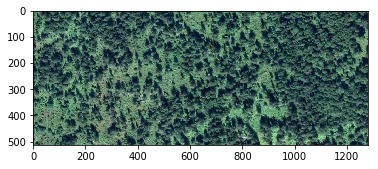

In [3]:
with rasterio.open('/home/user/data/ITC_dataset/irkutsk2_marked/orthophoto.tif') as src:
    img = src.read().transpose(1, 2,0)
    
plt.imshow(img)
plt.show()

In [4]:
img.shape

(513, 1281, 3)

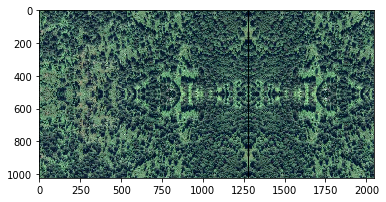

In [5]:
pad_0 = 1024 - img.shape[0]
pad_1 = 2048 - img.shape[1]
img_pad = np.pad(img, pad_width=((0, pad_0),(0, pad_1),(0,0)), mode='reflect')

plt.imshow(img_pad)
plt.show()

In [6]:
mask = base_model.predict(np.array([img_pad]))
mask.shape

(1, 1024, 2048, 1)

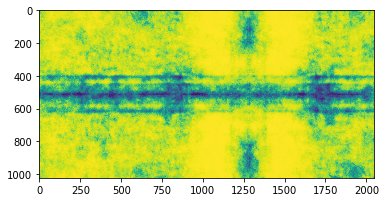

In [7]:
# The initial model shows certain 'Forest' response and it is good
plt.imshow(mask[0,0:img_pad.shape[0],0:img_pad.shape[1],0] )
plt.show()

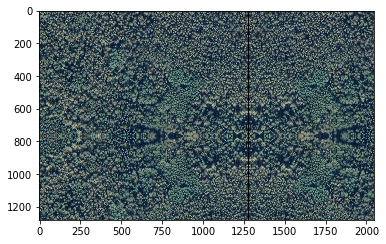

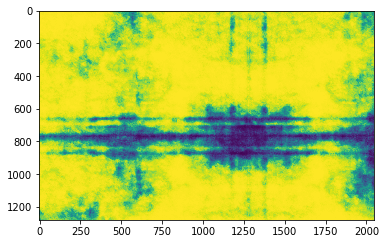

In [8]:
# Try other image with unforested areas
with rasterio.open('/home/user/data/ITC_dataset/perm1_marked/orthophoto.tif') as src:
    img = src.read().transpose(1,2,0)

img_pad = np.pad(img, pad_width=((0, pad_0),(0, pad_1),(0,0)), mode='reflect')

plt.imshow(img_pad)
plt.show()

mask = base_model.predict(np.array([img_pad]))
plt.imshow(mask[0,0:img_pad.shape[0],0:img_pad.shape[1],0])
plt.show()

# We will train the model on the ITC data 
- change the head
- fix all weights except head
- then fine-tune all the weights until it overfits
- profit?

In [9]:
# new head
x = keras.layers.Conv2D(3, (1,1))(base_model.layers[-1].layers[-3].output)
out = keras.layers.Activation(activation='softmax')(x)

inner_model = keras.models.Model(inputs=[base_model.layers[-1].layers[0].input], outputs=[out])

In [10]:
# Attach lambda layer
y = inner_model(base_model.layers[1].output)
model = keras.models.Model(inputs=[base_model.layers[0].input], outputs=[y])

In [11]:
# Train just as is
import albumentations as alb

train_transform = alb.Compose([
    
    alb.HorizontalFlip(p=0.5),
    # blur
    alb.OneOf([
            alb.MotionBlur(p=.2),
            alb.MedianBlur(blur_limit=3, p=0.1),
            alb.Blur(blur_limit=3, p=0.1),
        ], p=0.2),
    # color transforms
    alb.OneOf(
        [
            alb.RandomBrightnessContrast(always_apply=True),
            alb.RandomGamma(always_apply=True),
            alb.HueSaturationValue(always_apply=True),
            alb.IAASharpen(always_apply=True),
            alb.CLAHE(clip_limit=2),
            alb.IAASharpen(),
        ],
    p=0.5),
    
    # geometric transforms
    alb.OneOf(
        [
            alb.RandomScale(scale_limit=(-0.2, 0.2), always_apply=True),
            alb.GridDistortion(p=.1),
            alb.IAAPiecewiseAffine(p=0.3),
            #alb.IAAPiecewiseAffine(always_apply=True),
        ],
    p=0.5),
    alb.RandomCrop(256,256)
], p=1.)


In [11]:
# train_data = []
# CHANNELS = ['RED', 'GRN', 'BLU']
# LABELS = ['bounds', 'trees', 'bg']
# folders = ['/home/user/data/ilim_data/West 47 d1/resize_05m_West 47 d1',
#            '/home/user/data/ilim_data/West 48 d1/resize_05m_West 48 d1',
#            '/home/user/data/ilim_data/West 51 d1/resize_05m_West 51 d1',
#            '/home/user/data/ilim_data/West 52 d1/resize_05m_West 52 d1',
#            '/home/user/data/ilim_data/West 52 d2/resize_05m_West 52 d2',
#            '/home/user/data/ilim_data/West 52 d3/resize_05m_West 52 d3',
#            '/home/user/data/ilim_data/West 52 d4/resize_05m_West 52 d4',
#            '/home/user/data/ilim_data/West 53 d1/resize_05m_West 53 d1',
#            '/home/user/data/ilim_data/West 53 d2/resize_05m_West 53 d2',
#            '/home/user/data/ilim_data/West 92 d1/resize_05m_West 92 d1',]
# for folder in folders:
#     filenames=parse_directory(folder, CHANNELS+LABELS)
#     train_data.append(ds.BandCollection(filenames))


In [11]:
train_data = []
CHANNELS = ['RED', 'GRN', 'BLU']
LABELS = ['bounds', 'trees', 'bg']
for i in range(30):
    filenames=parse_directory('/home/user/data/ilim_data_03/'+str(i), CHANNELS+LABELS)
    train_data.append(ds.BandCollection(filenames))


In [12]:
train_data[0].crs

CRS({'init': 'epsg:32648'})

In [13]:
train_dataset = ds.RandomDataset(train_data, (256, 256), CHANNELS, LABELS)

@wraps(DataLoader)
def segmentation_generator(*args, **kwargs):
    #data_loader = DataLoader(*args, **kwargs)
    while True:
        data_loader = DataLoader(*args, **kwargs)
        for batch in data_loader:
            images = batch['image']
            masks = batch['mask']
            yield images.numpy(),  masks.numpy()

train_dataloader = segmentation_generator(train_dataset, batch_size=16, num_workers=0)

In [14]:
train_dataset

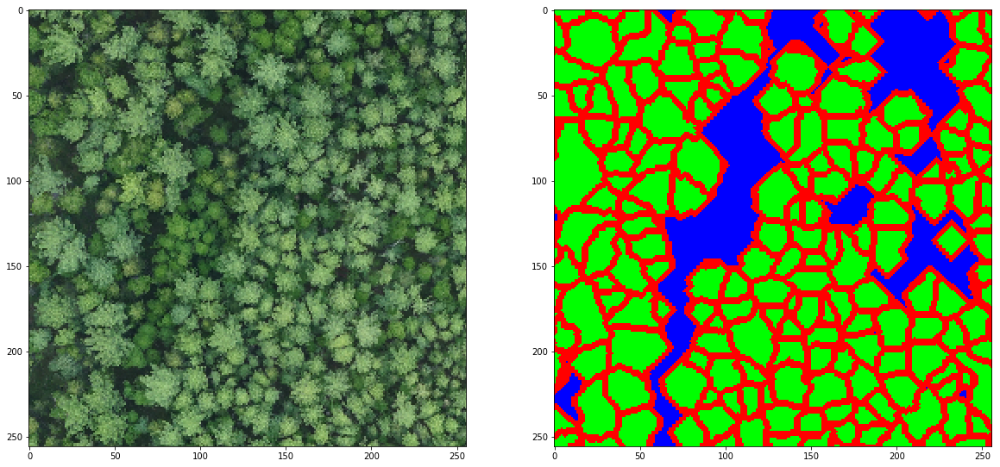

In [15]:
imgs, masks = train_dataloader.__next__()
img = imgs[1]
mask=masks[1]

plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(img)


plt.subplot(122)
plt.imshow(mask*255)
plt.show()



In [16]:
from keras import backend as K
def iou_score(gt, pr, class_weights=1., smooth=1e-12):
    axes = [1, 2]

    intersection = K.sum(gt * pr, axis=axes)
    union = K.sum(gt + pr, axis=axes) - intersection
    iou = (intersection + smooth) / (union + smooth)

    # mean per image
    iou = K.mean(iou, axis=0)

    # weighted mean per class
    iou = K.mean(iou * class_weights)
    return iou

In [17]:
# opt = keras.optimizers.Adam(lr=0.0001)
#     #
# loss = keras.losses.categorical_crossentropy
# metrics = [keras.metrics.categorical_crossentropy]
# model.compile(optimizer=opt, loss=loss, metrics=metrics)


In [18]:
# history = model.fit_generator(train_dataloader,
#                               steps_per_epoch=100,
#                               validation_data=train_dataloader,
#                               validation_steps=50,
#                               epochs=10, workers=0)

In [17]:
opt = keras.optimizers.Adam(lr=0.0001)
loss = keras.losses.categorical_crossentropy
metrics = [iou_score]
model.compile(optimizer=opt, loss=loss, metrics=metrics)
history = model.fit_generator(train_dataloader,
                              steps_per_epoch=100,
                              validation_data=train_dataloader,
                              validation_steps=50,
                              epochs=50,
                              workers=0)

Epoch 1/50
100/100 [==============================] - 45s 447ms/step - loss: 0.9814 - _iou_score: 0.2211 - val_loss: 0.9455 - val__iou_score: 0.2258
Epoch 2/50
100/100 [==============================] - 41s 410ms/step - loss: 0.8139 - _iou_score: 0.2686 - val_loss: 0.8857 - val__iou_score: 0.2371
Epoch 3/50
100/100 [==============================] - 41s 412ms/step - loss: 0.7296 - _iou_score: 0.3026 - val_loss: 0.7786 - val__iou_score: 0.2725
Epoch 4/50
100/100 [==============================] - 41s 411ms/step - loss: 0.6780 - _iou_score: 0.3256 - val_loss: 0.7071 - val__iou_score: 0.3068
Epoch 5/50
100/100 [==============================] - 41s 410ms/step - loss: 0.6401 - _iou_score: 0.3482 - val_loss: 0.7539 - val__iou_score: 0.3095
Epoch 6/50
100/100 [==============================] - 41s 411ms/step - loss: 0.6130 - _iou_score: 0.3616 - val_loss: 0.6419 - val__iou_score: 0.3461
Epoch 7/50
100/100 [==============================] - 41s 408ms/step - loss: 0.5988 - _iou_score: 0.3718 -

In [20]:
print('hello')

hello


In [18]:
def predict(model, image_name):
    with rasterio.open(image_name) as src:
        img = src.read().transpose(1,2,0)
    if img.shape[0] > 1024 or img.shape[1] > 2048:
        print('Too big')
        return None
    pad_0 = 1024 - img.shape[0]
    pad_1 = 2048 - img.shape[1]
    img_pad = np.pad(img, pad_width=((0, pad_0),(0, pad_1),(0,0)), mode='reflect')
    mask = model.predict(np.array([img_pad]))
    return mask[0, :img.shape[0], :img.shape[1]], img

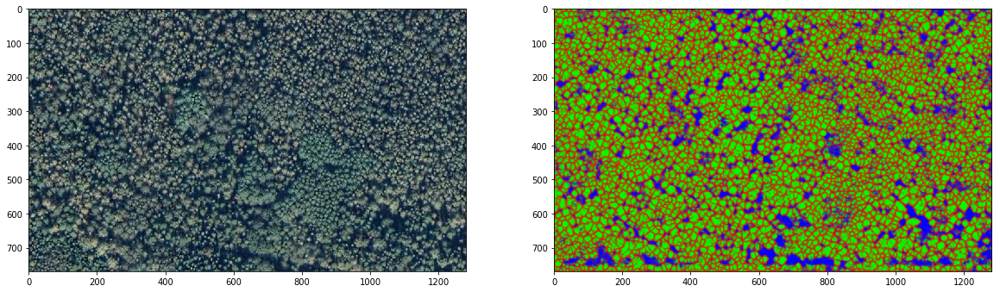

In [19]:
region = 'perm1'
image_name = '/home/user/data/ITC_dataset/perm1_marked/orthophoto.tif'.format(region)
mask, img = predict(model, image_name)
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(img)
plt.subplot(122)
plt.imshow(mask)
plt.show()

In [25]:
mask[:,:,0]

array([[2.3943542e-01, 1.2921397e-01, 1.0183541e-01, ..., 3.6669138e-01,
        3.8432702e-01, 2.7850163e-01],
       [1.3211182e-01, 5.7288509e-02, 3.6253452e-02, ..., 1.0801739e-01,
        1.3197811e-01, 6.6312231e-02],
       [2.0283347e-01, 9.3171410e-02, 6.0649224e-02, ..., 4.7768407e-02,
        5.8822852e-02, 3.2837395e-02],
       ...,
       [7.9222202e-02, 1.7723162e-02, 2.9631868e-02, ..., 2.4892372e-14,
        1.7354565e-13, 2.5736949e-12],
       [5.0915670e-02, 7.2537255e-03, 5.7181977e-03, ..., 6.6383802e-15,
        5.0554782e-14, 6.2553315e-13],
       [5.1216941e-02, 8.1669455e-03, 3.6894691e-03, ..., 8.3412408e-15,
        6.6075610e-14, 9.2316530e-13]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


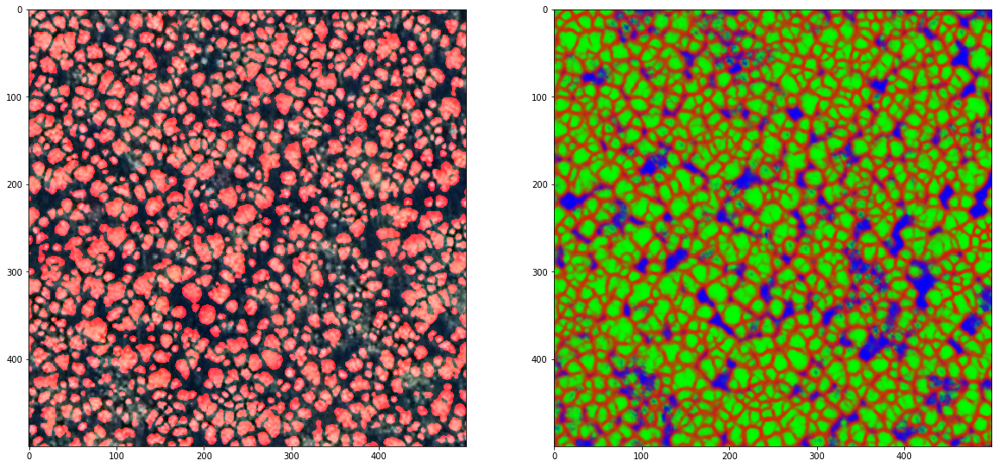

In [20]:
def plot_results(img, mask, miny=0, maxy=-1, minx=0, maxx=-1):
    plt.figure(figsize=(20,10))
    
    img_b = np.array([img[:,:,0].astype(np.uint16) + np.uint16((mask[:, :, 1]>0.5))*255, img[:,:,1] , img[:,:,2]]).transpose(1,2,0)

    plt.subplot(121)
    plt.imshow(img_b[miny:maxy, minx:maxx])
    plt.subplot(122)
    plt.imshow(mask[miny:maxy, minx:maxx])
    plt.show()

plot_results(img, mask, 0,500,0,500)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


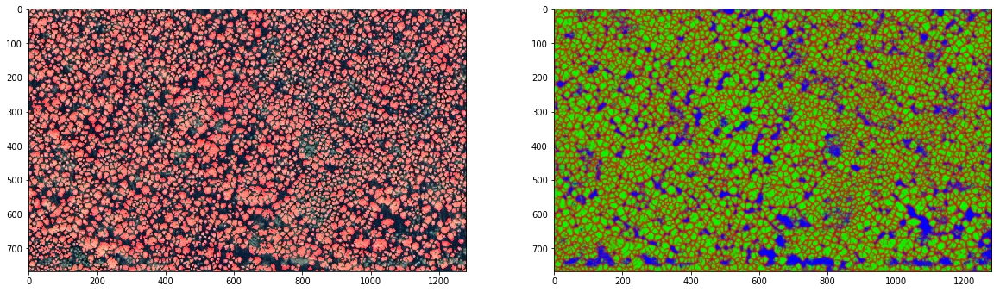

In [21]:
plot_results(img, mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


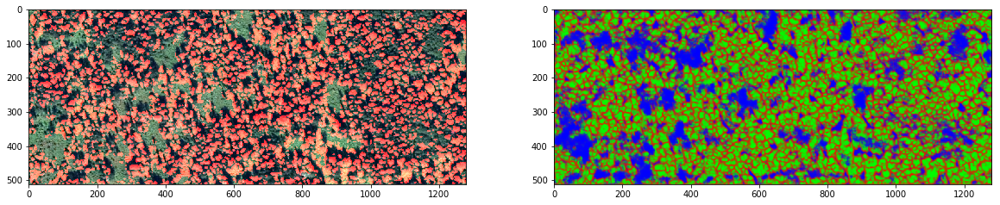

In [22]:
region = 'perm2'
image_name = '/home/user/data/ITC_dataset/irkutsk2_marked/orthophoto.tif'.format(region)
mask, img = predict(model, image_name)
plot_results(img, mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


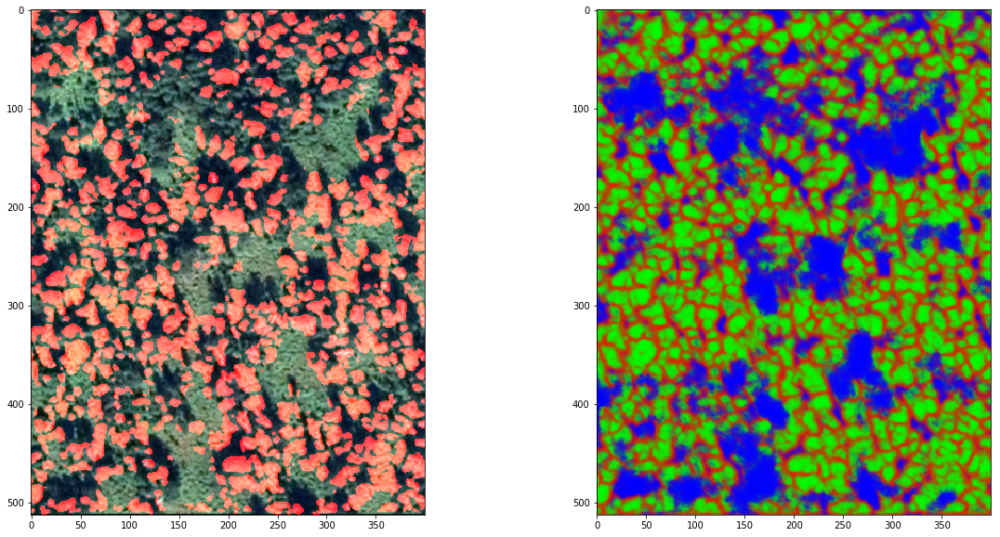

In [23]:
plot_results(img, mask, 0,900,100,500)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


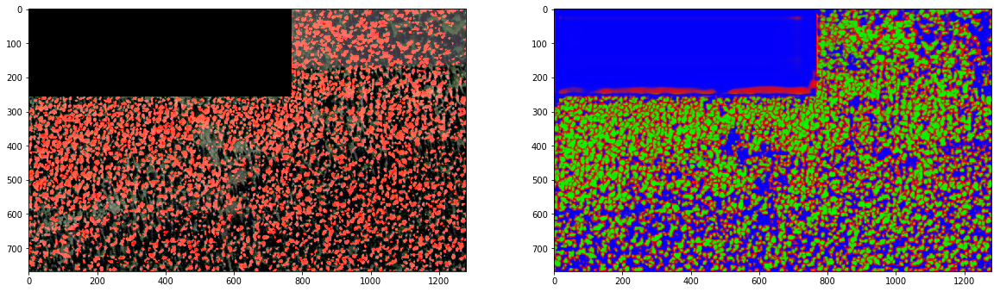

In [27]:
region = 'krsk1'
image_name = '/home/user/data/ITC_dataset/krsk1/orthophoto.tif'.format(region)
mask, img = predict(model, image_name)
plot_results(img, mask)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


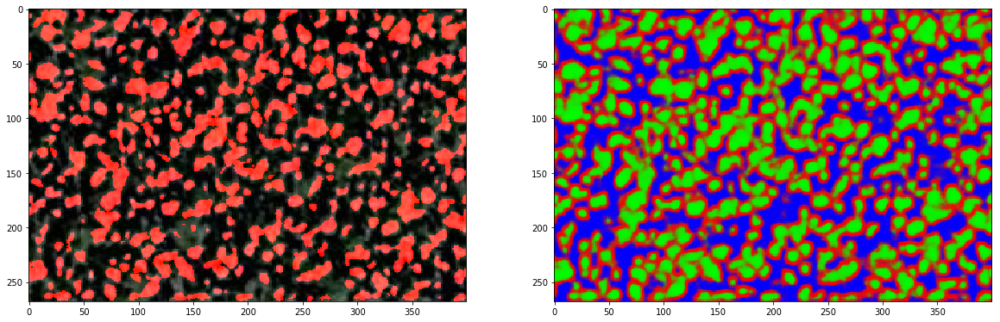

In [28]:
plot_results(img, mask, miny=500, minx=800, maxx=1200)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


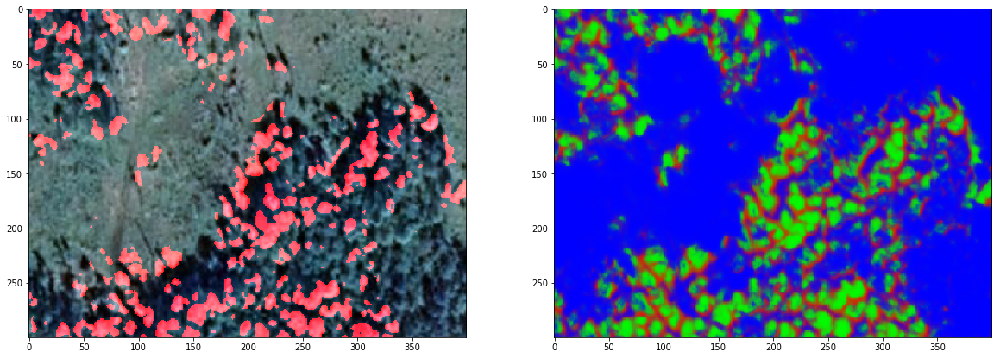

In [24]:
region = 'irkutsk1'
image_name = '/home/user/data/ITC_dataset/irkutsk1/orthophoto.tif'.format(region)
mask, img = predict(model, image_name)
plot_results(img, mask, miny=200, maxy=500, minx=800, maxx=1200)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


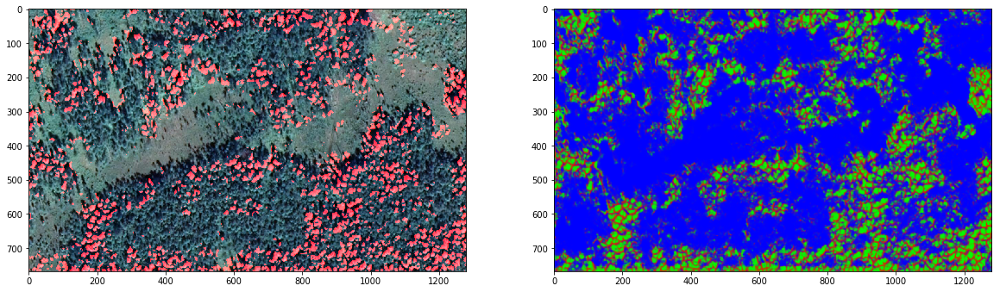

In [25]:
plot_results(img, mask)

# In general, it works. 
## Need more data and good markup at least for validation
## And a better per-object(?) validation metric